### The University of Melbourne, School of Computing and Information Systems
# COMP90086 Computer Vision, 2024 Semester 2

## Assignment 3

**Student Name:**    `PLEASE ENTER YOUR NAME HERE`

**Student ID:**     `PLEASE ENTER YOUR ID HERE`

## This iPython notebook is a template which you should use for your Assignment 3 submission. This file should be submitted at the **Assignment 3: Code** link on the LMS.

In addition to this file, you should submit a written report explaining your results at the **Assignment 3: Report** link on the LMS. Please see the assignment specification for details on what must be included in the report for each question.

*Adding proper comments to your code is MANDATORY.*

## Estimating depth from Stereo

Standard imports

In [90]:
import numpy as np
from numpy import inf
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf
import math
import os


A function to load an image file from the Middlebury dataset and downsample it by a factor of scale

In [91]:
def loadim(filename, scale):
    im = cv2.imread(filename)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = tf.cast(im,tf.float32)
    shape = im.shape
    shape = [1,*shape]
    im = tf.reshape(im,shape)
    im = tf.nn.avg_pool2d(input=im, ksize=(scale,scale), strides = (scale,scale), padding='VALID')
    return im

A function to load a disparity file from the Middlebury dataset and downsample it by a factor of scale

This function also modifies the offsets in the tensor by a factor of scale so that it is consistent with images at that scale

In [92]:
def loaddisparity(filename, scale):
    disp = cv2.imread(filename, cv2.IMREAD_UNCHANGED)
    with Path(filename).open('rb') as pfm_file:
        line1, line2, line3 = (pfm_file.readline().decode('latin-1').strip() for _ in range(3))
    fscale = abs(float(line3))

    # clean up the image and rescale
    disp[disp==inf]=0
    shape = disp.shape
    shape = [1,*shape,1]
    disp = tf.reshape(disp,shape)
    disp = tf.nn.max_pool2d(input = disp, ksize = (scale, scale), strides=(scale, scale), padding ='VALID')
    disp = disp * fscale / scale
    return disp


select a directory from the Middlebury dataset containing an image pair and corresponding disparities

The images are big (2016 high and 2940 wide) - so choose a scale to downsample them to more manageable size

Specify the size of window to use for matching

In [93]:
filepath = 'Middlebury/Backpack-perfect' # select a stereo pair to work on
scale = 8 # scale factor to shrink the images by
halfwin = 2 # number of pixels each side of the centre pixel to include in the matching window

Load two images and two disparities

In [94]:
im0 = loadim(filepath + '/im0.png', scale)
im1 = loadim(filepath + '/im1.png', scale)
disp0 = loaddisparity(filepath+'/disp0.pfm',scale)
disp1 = loaddisparity(filepath+'/disp1.pfm',scale)

Display them

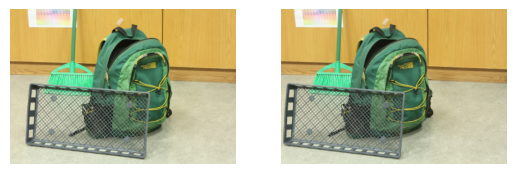

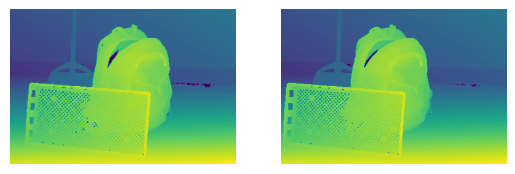

In [95]:
f, axarr = plt.subplots(1,2)
axarr[0].imshow(tf.cast(im0[0],tf.uint8).numpy())
axarr[0].set_axis_off()
axarr[1].imshow(tf.cast(im1[0],tf.uint8).numpy())
axarr[1].set_axis_off()

f, axarr = plt.subplots(1,2)
axarr[0].imshow(disp0[0])
axarr[0].set_axis_off()
axarr[1].imshow(disp1[0])
axarr[1].set_axis_off()

## Image warping

Use the ground truth disparity map to warp im0 to move the pixels to where they should be for im1

NB: this is very slow because we're workign one pixel at a time. At scale=8 this cell takes 15s on my M1 macbook air.

If you get worried that this is not working, try printing out i each time a row changes to monitor it

In [39]:
if scale>7:
    i0 = im0.numpy()
    remapped = np.zeros(im0.shape)
    b,rows,cols,_ = im0.shape
    for i in range(rows):
        for j in range(cols):
            offset = disp0[0,i,j,0]
            joff = int(j-offset)
            if(offset > 0 and joff >=0 and joff < cols):
                remapped[0,i,joff,:] = i0[0,i,j,:]


Display the im0->im1 warped image alongside im1 for comparison

In [40]:
if scale > 7:
    plt.figure(0)
    fig=plt.imshow(tf.cast(remapped[0],tf.uint8).numpy())
    fig.axes.set_axis_off()
    plt.figure(1)
    fig=plt.imshow(tf.cast(im1[0],tf.uint8).numpy())
    fig.axes.set_axis_off()

## Compute Disparity

Conduct a sweep over offets computing the squared error at each pixel between im1 and a shifted im0

In [41]:
#cheat a bit so that we're only considering disparities up to the maximum disparity in the ground truth
maxoffset = math.ceil(float(tf.math.reduce_max(disp0)))

b,rows,cols,_ = im0.shape
diffsumsq = []

# scan over the offset range we're interested in
for offset in range(maxoffset):
    # shift im0 by offset and compute the difference to im1
    diff = im1[0,:,0:cols-maxoffset,:] - im0[0,:,offset:cols-maxoffset+offset,:]
    # square the errors
    diffsq = diff*diff
    # sum over r,g,b errors and stack the error images into a list
    diffsumsq.append(tf.math.reduce_sum(diffsq,axis=-1,keepdims=True))

# turn the list of error images into a tensor - batch dimension scans over the offsets
diffsumsq = tf.stack(diffsumsq)


Make a kernel to add up the squared errors within a window

In [42]:
windowsize = 2 * halfwin + 1

kshape = [windowsize,windowsize,1,1]
kernel = np.ones(kshape)

Convolve the kernel with the stack of squared error images to get the squared error within each window at each offset

In [43]:
windowdiffsumsq = tf.nn.conv2d(diffsumsq,kernel,strides=1,padding='VALID')

sample the offsets and display the sum squared error within each window at each offset

Features should disappear at the correct disparity

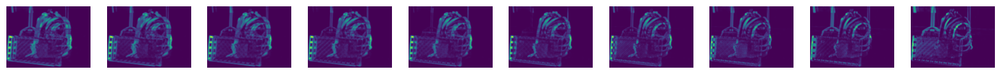

In [44]:
f, axarr = plt.subplots(1,10,figsize=(20,16))
for i in range(10):
    axarr[i].imshow(windowdiffsumsq[i*2])
    axarr[i].set_axis_off()

Find the best disparirty for each pixel by finding the position of the minimum error using argmin

In [45]:
bestoffset = tf.math.argmin(windowdiffsumsq, axis=0)
bestoffset = tf.cast(bestoffset,tf.float32)

Choose the part of the ground truth disparity image that corresponds to the one we have computed taking into account pixels lost due to windowing and from the disparity sweep

In [46]:
outr, outc, _ = bestoffset.shape
gt = disp1[0, halfwin:halfwin+outr, halfwin:halfwin+outc,:]

Display our computed disparity and the ground truth disparity

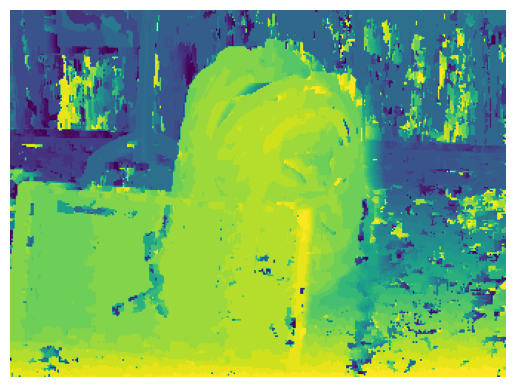

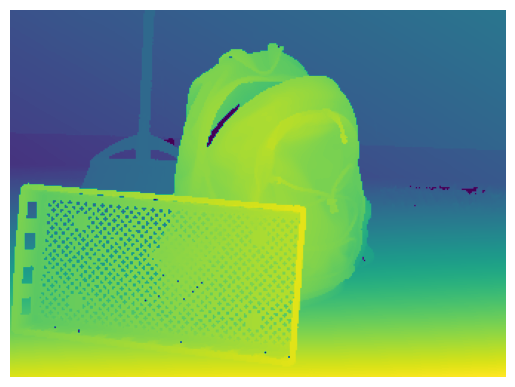

In [47]:
plt.figure(0)
fig = plt.imshow(bestoffset)
fig.axes.set_axis_off()
plt.figure(1)
fig = plt.imshow(gt)
fig.axes.set_axis_off()

Calculate how well we did.  Count the number of pixels for which we have a ground truth disparity that are within a disparity error of 2.5 pixels of the ground truth and report as an accuracy percentage

In [48]:
disperror = tf.math.abs(bestoffset - gt)

could = gt!=0
good = tf.logical_and(could, disperror < 2.5)

numgood = (int(tf.math.count_nonzero(good)))
numcould = (int(tf.math.count_nonzero(could)))

print (numgood, ' out of ', numcould, ' pixels = ', 100*numgood/numcould, '%')


64127  out of  82892  pixels =  77.36210973314674 %


## Task 2

Running for scale=2, halfwin=1
Scale: 2, Halfwin: 1, Accuracy: 36.83%
Running for scale=2, halfwin=2
Scale: 2, Halfwin: 2, Accuracy: 51.31%
Running for scale=2, halfwin=4
Scale: 2, Halfwin: 4, Accuracy: 69.13%
Running for scale=2, halfwin=5
Scale: 2, Halfwin: 5, Accuracy: 73.33%
Running for scale=2, halfwin=8
Scale: 2, Halfwin: 8, Accuracy: 77.60%
Running for scale=2, halfwin=9
Scale: 2, Halfwin: 9, Accuracy: 77.87%
Running for scale=2, halfwin=10
Scale: 2, Halfwin: 10, Accuracy: 77.99%
Running for scale=2, halfwin=11
Scale: 2, Halfwin: 11, Accuracy: 77.97%
Running for scale=2, halfwin=12
Scale: 2, Halfwin: 12, Accuracy: 77.86%
Running for scale=2, halfwin=13
Scale: 2, Halfwin: 13, Accuracy: 77.70%
Running for scale=2, halfwin=14
Scale: 2, Halfwin: 14, Accuracy: 77.52%
Running for scale=2, halfwin=15
Scale: 2, Halfwin: 15, Accuracy: 77.31%
Running for scale=4, halfwin=1
Scale: 4, Halfwin: 1, Accuracy: 52.36%
Running for scale=4, halfwin=2
Scale: 4, Halfwin: 2, Accuracy: 67.93%
Running 

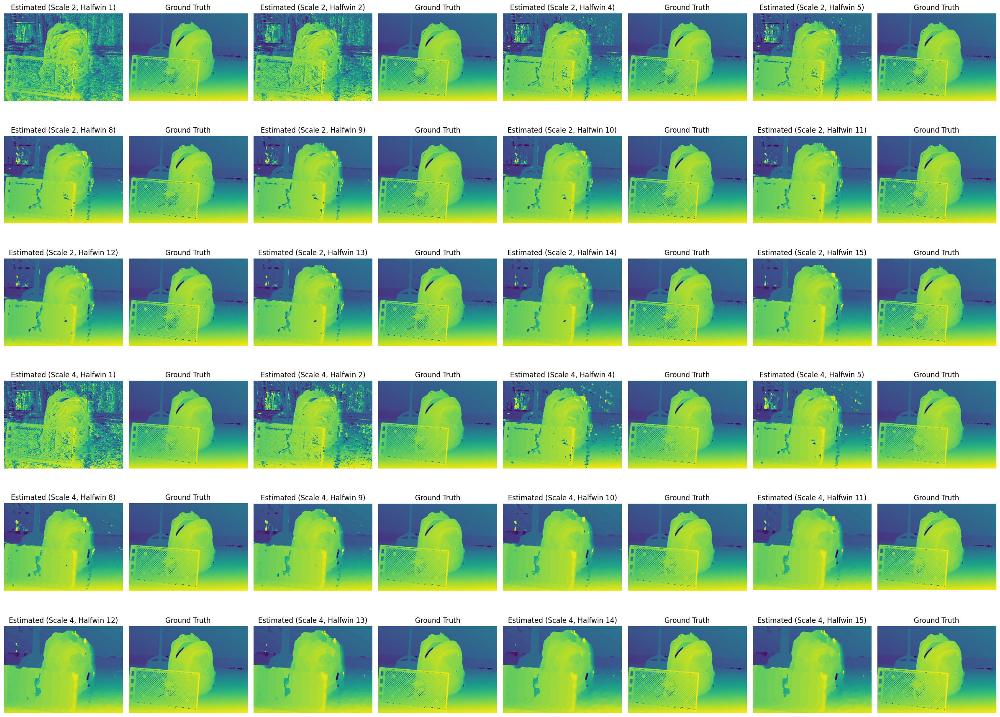


Results for Task 3:
| Configuration             | Accuracy (%) |
|---------------------------|--------------|
| Scale 2, Halfwin 1        | 36.83%      |
| Scale 2, Halfwin 2        | 51.31%      |
| Scale 2, Halfwin 4        | 69.13%      |
| Scale 2, Halfwin 5        | 73.33%      |
| Scale 2, Halfwin 8        | 77.60%      |
| Scale 2, Halfwin 9        | 77.87%      |
| Scale 2, Halfwin 10       | 77.99%      |
| Scale 2, Halfwin 11       | 77.97%      |
| Scale 2, Halfwin 12       | 77.86%      |
| Scale 2, Halfwin 13       | 77.70%      |
| Scale 2, Halfwin 14       | 77.52%      |
| Scale 2, Halfwin 15       | 77.31%      |
| Scale 4, Halfwin 1        | 52.36%      |
| Scale 4, Halfwin 2        | 67.93%      |
| Scale 4, Halfwin 4        | 79.69%      |
| Scale 4, Halfwin 5        | 81.21%      |
| Scale 4, Halfwin 8        | 82.28%      |
| Scale 4, Halfwin 9        | 82.15%      |
| Scale 4, Halfwin 10       | 81.90%      |
| Scale 4, Halfwin 11       | 81.55%      |
| Scale 4

In [84]:
# Set different combinations of scale and halfwin parameters
scales = [2, 4]
halfwin_values = [1, 2, 4, 5, 8, 9, 10, 11, 12, 13, 14, 15]  # Try different window sizes

# Create an empty list to store the results
results = []
image_data = []  # To store all image data

# Loop through different scale and halfwin parameters
for scale in scales:
    for halfwin in halfwin_values:
        print(f'Running for scale={scale}, halfwin={halfwin}')
        
        # Load the images and disparity maps, scaling them according to the different scales
        im0 = loadim(filepath + '/im0.png', scale)
        im1 = loadim(filepath + '/im1.png', scale)
        disp0 = loaddisparity(filepath + '/disp0.pfm', scale)
        disp1 = loaddisparity(filepath + '/disp1.pfm', scale)
        
        # Cheat a bit by only considering disparities up to the maximum disparity in the ground truth
        maxoffset = math.ceil(float(tf.math.reduce_max(disp0)))

        b, rows, cols, _ = im0.shape
        diffsumsq = []

        # Scan over the offset range we are interested in
        for offset in range(maxoffset):
            # Shift im0 by offset and compute the difference with im1
            diff = im1[0, :, 0:cols-maxoffset, :] - im0[0, :, offset:cols-maxoffset+offset, :]
            # Square the errors
            diffsq = diff * diff
            # Sum over the r, g, b errors and stack the error images into a list
            diffsumsq.append(tf.math.reduce_sum(diffsq, axis=-1, keepdims=True))

        # Turn the list of error images into a tensor - the batch dimension scans over the offsets
        diffsumsq = tf.stack(diffsumsq)

        windowsize = 2 * halfwin + 1

        kshape = [windowsize, windowsize, 1, 1]
        kernel = np.ones(kshape)
        
        windowdiffsumsq = tf.nn.conv2d(diffsumsq, kernel, strides=1, padding='VALID')
                
        bestoffset = tf.math.argmin(windowdiffsumsq, axis=0)
        bestoffset = tf.cast(bestoffset, tf.float32)

        outr, outc, _ = bestoffset.shape
        gt = disp1[0, halfwin:halfwin+outr, halfwin:halfwin+outc, :]
        
        disperror = tf.math.abs(bestoffset - gt)

        could = gt != 0
        good = tf.logical_and(could, disperror < 2.5)

        numgood = int(tf.math.count_nonzero(good))
        numcould = int(tf.math.count_nonzero(could))
        accuracy = 100 * numgood / numcould
        
        # Save the result into the list
        results.append((f"Scale {scale}, Halfwin {halfwin}", accuracy))
        
        print(f'Scale: {scale}, Halfwin: {halfwin}, Accuracy: {accuracy:.2f}%')
        
        # Save the estimated disparity map and the ground truth disparity map into image_data list
        image_data.append((bestoffset.numpy(), gt.numpy(), f"Scale {scale}, Halfwin {halfwin}"))

# Finally, display all images on a single figure, divided into 4 rows, with 8 columns (4 groups × 2 images)
num_images = len(image_data)
cols_per_group = 2  # 4 rows
num_groups_per_row = 4   # 4 groups per row, each group contains 2 images (8 columns)

rows = math.ceil(num_images / num_groups_per_row)
total_cols = num_groups_per_row * cols_per_group

fig, axs = plt.subplots(rows, total_cols, figsize=(24, rows * 3)) # Create a large figure to fit all subplots (2 subplots per group: prediction and ground truth)

for idx, (pred_image, gt_image, title) in enumerate(image_data):
    row = idx // num_groups_per_row # Row index
    col = (idx % num_groups_per_row) * cols_per_group  # Start column for each group, 2 columns per group

    # Display the estimated disparity map
    axs[row, col].imshow(pred_image, cmap='viridis')  # Display the predicted result using pseudocolor
    axs[row, col].set_title(f"Estimated ({title})")
    axs[row, col].set_axis_off()

    # Display the ground truth disparity map
    axs[row, col + 1].imshow(gt_image, cmap='viridis')  # Display the ground truth disparity map using pseudocolor
    axs[row, col + 1].set_title("Ground Truth")
    axs[row, col + 1].set_axis_off()

# Hide extra subplot frames (if any)
for ax in axs.flat:
    ax.set_axis_off()

plt.tight_layout()
plt.show()

# Print the results table
print("\nResults for Task 2:")
print("| Configuration             | Accuracy (%) |")
print("|---------------------------|--------------|")
for config, accuracy in results:
    print(f"| {config:<25} | {accuracy:.2f}%      |")


## Task 3

In [53]:
# Create a Gaussian weighted convolution kernel
def create_gaussian_kernel(halfwin):
    windowsize = 2 * halfwin + 1
    sigma = halfwin / 2.0

    # Generate a 1D Gaussian kernel and expand it into a 2D Gaussian kernel
    gauss_1d = cv2.getGaussianKernel(windowsize, sigma)
    gauss_2d = gauss_1d @ gauss_1d.T  # 2D Gaussian kernel

    # Expand the 2D Gaussian kernel into a 4D kernel (height, width, in_channels, out_channels)
    gaussian_kernel_4d = gauss_2d[:, :, np.newaxis, np.newaxis]
    
    return gaussian_kernel_4d


Running for scale=2, halfwin=1
Scale: 2, Halfwin: 1, Accuracy: 31.34%
Running for scale=2, halfwin=2
Scale: 2, Halfwin: 2, Accuracy: 43.46%
Running for scale=2, halfwin=4
Scale: 2, Halfwin: 4, Accuracy: 62.36%
Running for scale=2, halfwin=5
Scale: 2, Halfwin: 5, Accuracy: 68.24%
Running for scale=2, halfwin=8
Scale: 2, Halfwin: 8, Accuracy: 76.22%
Running for scale=2, halfwin=9
Scale: 2, Halfwin: 9, Accuracy: 77.14%
Running for scale=2, halfwin=10
Scale: 2, Halfwin: 10, Accuracy: 77.65%
Running for scale=2, halfwin=11
Scale: 2, Halfwin: 11, Accuracy: 77.96%
Running for scale=2, halfwin=12
Scale: 2, Halfwin: 12, Accuracy: 78.13%
Running for scale=2, halfwin=13
Scale: 2, Halfwin: 13, Accuracy: 78.20%
Running for scale=2, halfwin=14
Scale: 2, Halfwin: 14, Accuracy: 78.18%
Running for scale=2, halfwin=15
Scale: 2, Halfwin: 15, Accuracy: 78.11%
Running for scale=4, halfwin=1
Scale: 4, Halfwin: 1, Accuracy: 44.65%
Running for scale=4, halfwin=2
Scale: 4, Halfwin: 2, Accuracy: 59.94%
Running 

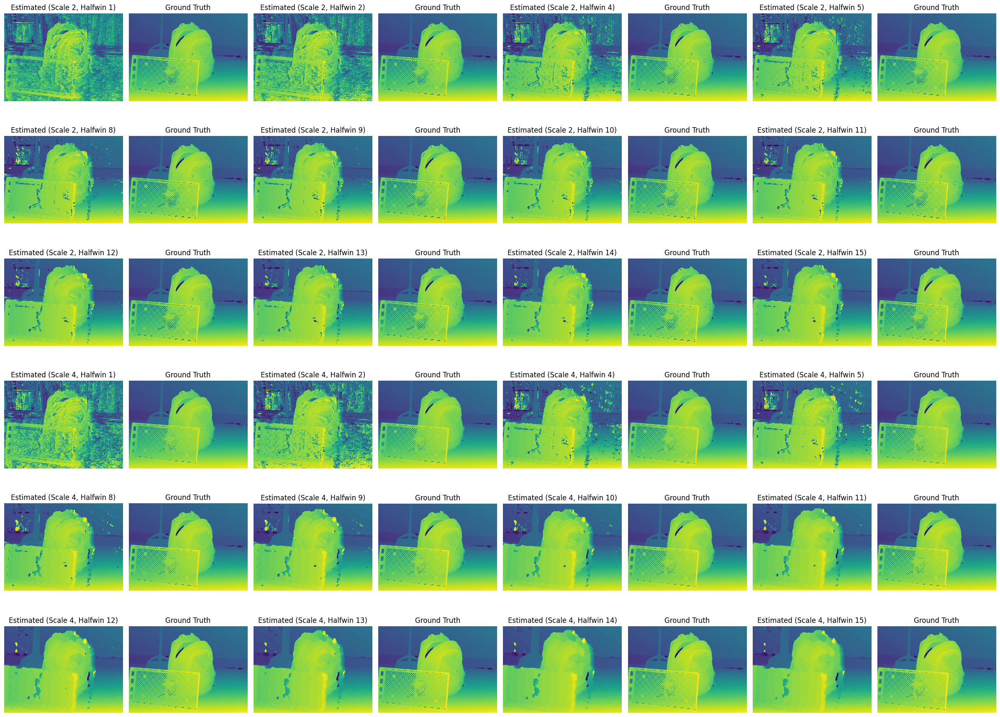


Results for Task 3:
| Configuration             | Accuracy (%) |
|---------------------------|--------------|
| Scale 2, Halfwin 1        | 31.34%      |
| Scale 2, Halfwin 2        | 43.46%      |
| Scale 2, Halfwin 4        | 62.36%      |
| Scale 2, Halfwin 5        | 68.24%      |
| Scale 2, Halfwin 8        | 76.22%      |
| Scale 2, Halfwin 9        | 77.14%      |
| Scale 2, Halfwin 10       | 77.65%      |
| Scale 2, Halfwin 11       | 77.96%      |
| Scale 2, Halfwin 12       | 78.13%      |
| Scale 2, Halfwin 13       | 78.20%      |
| Scale 2, Halfwin 14       | 78.18%      |
| Scale 2, Halfwin 15       | 78.11%      |
| Scale 4, Halfwin 1        | 44.65%      |
| Scale 4, Halfwin 2        | 59.94%      |
| Scale 4, Halfwin 4        | 76.29%      |
| Scale 4, Halfwin 5        | 79.29%      |
| Scale 4, Halfwin 8        | 82.07%      |
| Scale 4, Halfwin 9        | 82.17%      |
| Scale 4, Halfwin 10       | 82.15%      |
| Scale 4, Halfwin 11       | 82.05%      |
| Scale 4

In [83]:
# Set different combinations of scale and halfwin parameters
scales = [2, 4]
halfwin_values = [1, 2, 4, 5, 8, 9, 10, 11, 12, 13, 14, 15]  # Try different window sizes

# Create an empty list to store the results
results = []
image_data = []  # To store all image data

# Loop through different scale and halfwin parameters
for scale in scales:
    for halfwin in halfwin_values:
        print(f'Running for scale={scale}, halfwin={halfwin}')
        
        # Load the images and disparity maps, scaling them according to the different scales
        im0 = loadim(filepath + '/im0.png', scale)
        im1 = loadim(filepath + '/im1.png', scale)
        disp0 = loaddisparity(filepath + '/disp0.pfm', scale)
        disp1 = loaddisparity(filepath + '/disp1.pfm', scale)
        
        # Cheat a bit by only considering disparities up to the maximum disparity in the ground truth
        maxoffset = math.ceil(float(tf.math.reduce_max(disp0)))

        b, rows, cols, _ = im0.shape
        diffsumsq = []

        # Scan over the offset range we are interested in
        for offset in range(maxoffset):
            # Shift im0 by offset and compute the difference with im1
            diff = im1[0, :, 0:cols-maxoffset, :] - im0[0, :, offset:cols-maxoffset+offset, :]
            # Square the errors
            diffsq = diff * diff
            # Sum over the r, g, b errors and stack the error images into a list
            diffsumsq.append(tf.math.reduce_sum(diffsq, axis=-1, keepdims=True))

        # Turn the list of error images into a tensor - the batch dimension scans over the offsets
        diffsumsq = tf.stack(diffsumsq)

        # Create a Gaussian weighted convolution kernel
        kernel = create_gaussian_kernel(halfwin) 
        
        windowdiffsumsq = tf.nn.conv2d(diffsumsq, kernel, strides=1, padding='VALID')
                
        bestoffset = tf.math.argmin(windowdiffsumsq, axis=0)
        bestoffset = tf.cast(bestoffset, tf.float32)

        outr, outc, _ = bestoffset.shape
        gt = disp1[0, halfwin:halfwin+outr, halfwin:halfwin+outc, :]
        
        disperror = tf.math.abs(bestoffset - gt)

        could = gt != 0
        good = tf.logical_and(could, disperror < 2.5)

        numgood = int(tf.math.count_nonzero(good))
        numcould = int(tf.math.count_nonzero(could))
        accuracy = 100 * numgood / numcould
        
        # Save the result into the list
        results.append((f"Scale {scale}, Halfwin {halfwin}", accuracy))
        
        print(f'Scale: {scale}, Halfwin: {halfwin}, Accuracy: {accuracy:.2f}%')
        
        # Save the estimated disparity map and the ground truth disparity map into image_data list
        image_data.append((bestoffset.numpy(), gt.numpy(), f"Scale {scale}, Halfwin {halfwin}"))

# Finally, display all images on a single figure, divided into 4 rows, with 8 columns (4 groups × 2 images)
num_images = len(image_data)
cols_per_group = 2  # 4 rows
num_groups_per_row = 4   # 4 groups per row, each group contains 2 images (8 columns)

rows = math.ceil(num_images / num_groups_per_row)
total_cols = num_groups_per_row * cols_per_group

fig, axs = plt.subplots(rows, total_cols, figsize=(24, rows * 3)) # Create a large figure to fit all subplots (2 subplots per group: prediction and ground truth)

for idx, (pred_image, gt_image, title) in enumerate(image_data):
    row = idx // num_groups_per_row # Row index
    col = (idx % num_groups_per_row) * cols_per_group  # Start column for each group, 2 columns per group

    # Display the estimated disparity map
    axs[row, col].imshow(pred_image, cmap='viridis')  # Display the predicted result using pseudocolor
    axs[row, col].set_title(f"Estimated ({title})")
    axs[row, col].set_axis_off()

    # Display the ground truth disparity map
    axs[row, col + 1].imshow(gt_image, cmap='viridis')  # Display the ground truth disparity map using pseudocolor
    axs[row, col + 1].set_title("Ground Truth")
    axs[row, col + 1].set_axis_off()

# Hide extra subplot frames (if any)
for ax in axs.flat:
    ax.set_axis_off()

plt.tight_layout()
plt.show()

# Print the results table
print("\nResults for Task 3:")
print("| Configuration             | Accuracy (%) |")
print("|---------------------------|--------------|")
for config, accuracy in results:
    print(f"| {config:<25} | {accuracy:.2f}%      |")


## Task 4

In [55]:
# Set the root folder path
root_folder = 'Middlebury'
# Define the list of image folders
image_folders = ['Adirondack-perfect', 'Backpack-perfect', 'Cable-perfect', 
                     'Classroom1-perfect', 'Mask-perfect', 'Motorcycle-perfect', 
                     'Piano-perfect', 'Pipes-perfect', 'Playroom-perfect', 'Vintage-perfect']

In [87]:

def tast4gaussian(scale,halfwin):
    # Define the best window size and scale factor
    best_halfwin = halfwin  
    scale = scale  # Set fixed scale factor to 2

    # Create lists to store the results and image data
    results = []
    image_data = []

    # Define the disparity estimation function
    def disparity_estimation_gaussian(im0, im1, disp0, disp1, halfwin):
        kernel = create_gaussian_kernel(halfwin)
        maxoffset = math.ceil(float(tf.math.reduce_max(disp0)))  # Maximum disparity
        b, rows, cols, _ = im0.shape
        diffsumsq = []

        # Iterate over disparity offsets
        for offset in range(maxoffset):
            diff = im1[0, :, 0:cols-maxoffset, :] - im0[0, :, offset:cols-maxoffset+offset, :]
            diffsq = diff * diff
            diffsumsq.append(tf.math.reduce_sum(diffsq, axis=-1, keepdims=True))
        
        diffsumsq = tf.stack(diffsumsq)  # Stack the differences

        # Apply window-based aggregation
        windowdiffsumsq = tf.nn.conv2d(diffsumsq, kernel, strides=1, padding='VALID')
        
        # Find the best disparity offset with the minimum error
        bestoffset = tf.math.argmin(windowdiffsumsq, axis=0)
        bestoffset = tf.cast(bestoffset, tf.float32)

        # Align the ground truth disparity with the computed disparity
        outr, outc, _ = bestoffset.shape
        gt = disp1[0, halfwin:halfwin+outr, halfwin:halfwin+outc, :]
        
        # Compute the disparity error
        disperror = tf.math.abs(bestoffset - gt)
        could = gt != 0  # Mask of valid ground truth pixels
        good = tf.logical_and(could, disperror < 2.5)
        
        numgood = int(tf.math.count_nonzero(good))
        numcould = int(tf.math.count_nonzero(could))
        accuracy = 100 * numgood / numcould
        print(f'Scale: {scale}, Halfwin: {halfwin}, Accuracy: {accuracy:.2f}%')
        # Return the computed disparity map, ground truth, and accuracy
        return bestoffset.numpy(), gt.numpy(), accuracy

    # Iterate over all image folders and estimate disparity
    for folder in image_folders:
        # Set the folder path
        folder_path = os.path.join(root_folder, folder)
        
        # Load images and disparity maps
        im0 = loadim(os.path.join(folder_path, 'im0.png'), scale)
        im1 = loadim(os.path.join(folder_path, 'im1.png'), scale)
        disp0 = loaddisparity(os.path.join(folder_path, 'disp0.pfm'), scale)
        disp1 = loaddisparity(os.path.join(folder_path, 'disp1.pfm'), scale)
        # Run disparity estimation and record accuracy
        print(f'Running for picture {folder}')
        pred_image, gt_image, accuracy = disparity_estimation_gaussian(im0, im1, disp0, disp1, best_halfwin)
        results.append((folder, accuracy))  # Store results for each image pair
        image_data.append((pred_image, gt_image, f"Scale {scale}, Halfwin {best_halfwin}"))

    # Number of images and layout settings
    num_images = len(image_data)
    rows = 3  # 3 rows
    cols = 8  # 4 pairs of images per row, each pair includes estimated and ground truth (8 columns)

    fig, axs = plt.subplots(rows, cols, figsize=(24, 9))  # Create large figure to fit all subplots (2 images per pair)

    # Iterate through the image data and plot each pair of images
    for idx, (pred_image, gt_image, title) in enumerate(image_data):
        row = idx // 4  # Row index
        col = (idx % 4) * 2  # Column index, each pair takes up 2 columns

        # Display the estimated disparity map
        axs[row, col].imshow(pred_image, cmap='viridis')  # Use pseudocolor to display the predicted disparity
        axs[row, col].set_title(f"Estimated ({title})")
        axs[row, col].set_axis_off()

        # Display the ground truth disparity map
        axs[row, col+1].imshow(gt_image, cmap='viridis')  # Use pseudocolor to display the ground truth disparity
        axs[row, col+1].set_title("Ground Truth")
        axs[row, col+1].set_axis_off()

    # Hide any extra subplot frames (if any)
    for ax in axs.flat:
        ax.set_axis_off()

    # Print accuracy results in table format
    print(f"Results for Task 4: Gaussian best_halfwin:{best_halfwin}")
    print("| Image Folder      | Accuracy (%) |")
    print("|-------------------|--------------|")
    for folder, accuracy in results:
        print(f"| {folder:<17} | {accuracy:.2f}%      |")


Running for picture Adirondack-perfect
Scale: 2, Halfwin: 13, Accuracy: 53.36%
Running for picture Backpack-perfect
Scale: 2, Halfwin: 13, Accuracy: 78.20%
Running for picture Cable-perfect
Scale: 2, Halfwin: 13, Accuracy: 60.61%
Running for picture Classroom1-perfect
Scale: 2, Halfwin: 13, Accuracy: 51.82%
Running for picture Mask-perfect
Scale: 2, Halfwin: 13, Accuracy: 58.88%
Running for picture Motorcycle-perfect
Scale: 2, Halfwin: 13, Accuracy: 77.22%
Running for picture Piano-perfect
Scale: 2, Halfwin: 13, Accuracy: 67.74%
Running for picture Pipes-perfect
Scale: 2, Halfwin: 13, Accuracy: 66.81%
Running for picture Playroom-perfect
Scale: 2, Halfwin: 13, Accuracy: 51.40%
Running for picture Vintage-perfect
Scale: 2, Halfwin: 13, Accuracy: 64.18%
Results for Task 4: Gaussian best_halfwin:13
| Image Folder      | Accuracy (%) |
|-------------------|--------------|
| Adirondack-perfect | 53.36%      |
| Backpack-perfect  | 78.20%      |
| Cable-perfect     | 60.61%      |
| Classroo

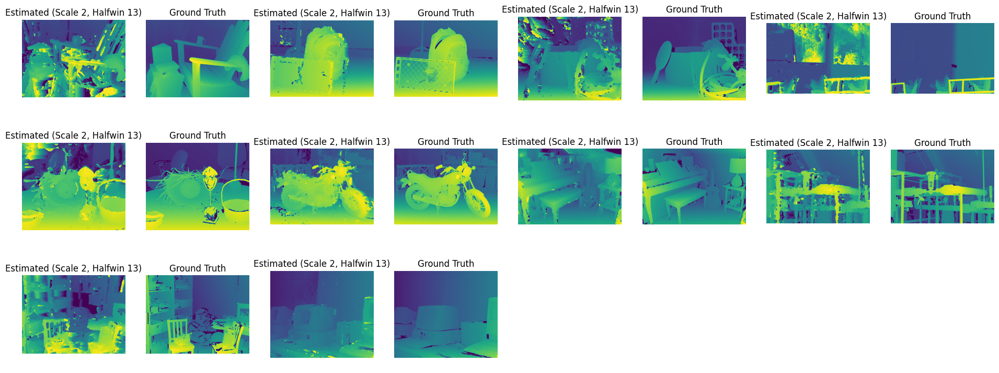

In [88]:
tast4gaussian(2,13)

In [86]:

def task4one(scale,halfwin):
    # Define the best window size and scale factor
    best_halfwin = halfwin  
    scale = scale  # Set fixed scale factor to 2

    # Create lists to store the results and image data
    results = []
    image_data = []

    # Define the disparity estimation function
    def disparity_estimation_gaussian(im0, im1, disp0, disp1, halfwin):
        windowsize = 2 * halfwin + 1

        kshape = [windowsize, windowsize, 1, 1]
        kernel = np.ones(kshape)    

        maxoffset = math.ceil(float(tf.math.reduce_max(disp0)))  # Maximum disparity
        b, rows, cols, _ = im0.shape
        diffsumsq = []

        # Iterate over disparity offsets
        for offset in range(maxoffset):
            diff = im1[0, :, 0:cols-maxoffset, :] - im0[0, :, offset:cols-maxoffset+offset, :]
            diffsq = diff * diff
            diffsumsq.append(tf.math.reduce_sum(diffsq, axis=-1, keepdims=True))
        
        diffsumsq = tf.stack(diffsumsq)  # Stack the differences

        # Apply window-based aggregation
        windowdiffsumsq = tf.nn.conv2d(diffsumsq, kernel, strides=1, padding='VALID')
        
        # Find the best disparity offset with the minimum error
        bestoffset = tf.math.argmin(windowdiffsumsq, axis=0)
        bestoffset = tf.cast(bestoffset, tf.float32)

        # Align the ground truth disparity with the computed disparity
        outr, outc, _ = bestoffset.shape
        gt = disp1[0, halfwin:halfwin+outr, halfwin:halfwin+outc, :]
        
        # Compute the disparity error
        disperror = tf.math.abs(bestoffset - gt)
        could = gt != 0  # Mask of valid ground truth pixels
        good = tf.logical_and(could, disperror < 2.5)
        
        numgood = int(tf.math.count_nonzero(good))
        numcould = int(tf.math.count_nonzero(could))
        accuracy = 100 * numgood / numcould
        print(f'Scale: {scale}, Halfwin: {halfwin}, Accuracy: {accuracy:.2f}%')
        # Return the computed disparity map, ground truth, and accuracy
        return bestoffset.numpy(), gt.numpy(), accuracy

    # Iterate over all image folders and estimate disparity
    for folder in image_folders:
        # Set the folder path
        folder_path = os.path.join(root_folder, folder)
        
        # Load images and disparity maps
        im0 = loadim(os.path.join(folder_path, 'im0.png'), scale)
        im1 = loadim(os.path.join(folder_path, 'im1.png'), scale)
        disp0 = loaddisparity(os.path.join(folder_path, 'disp0.pfm'), scale)
        disp1 = loaddisparity(os.path.join(folder_path, 'disp1.pfm'), scale)
        # Run disparity estimation and record accuracy
        print(f'Running for picture {folder}')
        pred_image, gt_image, accuracy = disparity_estimation_gaussian(im0, im1, disp0, disp1, best_halfwin)
        results.append((folder, accuracy))  # Store results for each image pair
        image_data.append((pred_image, gt_image, f"Scale {scale}, Halfwin {best_halfwin}"))

    # Number of images and layout settings
    num_images = len(image_data)
    rows = 3  # 3 rows
    cols = 8  # 4 pairs of images per row, each pair includes estimated and ground truth (8 columns)

    fig, axs = plt.subplots(rows, cols, figsize=(24, 9))  # Create large figure to fit all subplots (2 images per pair)

    # Iterate through the image data and plot each pair of images
    for idx, (pred_image, gt_image, title) in enumerate(image_data):
        row = idx // 4  # Row index
        col = (idx % 4) * 2  # Column index, each pair takes up 2 columns

        # Display the estimated disparity map
        axs[row, col].imshow(pred_image, cmap='viridis')  # Use pseudocolor to display the predicted disparity
        axs[row, col].set_title(f"Estimated ({title})")
        axs[row, col].set_axis_off()

        # Display the ground truth disparity map
        axs[row, col+1].imshow(gt_image, cmap='viridis')  # Use pseudocolor to display the ground truth disparity
        axs[row, col+1].set_title("Ground Truth")
        axs[row, col+1].set_axis_off()

    # Hide any extra subplot frames (if any)
    for ax in axs.flat:
        ax.set_axis_off()

    # Print accuracy results in table format
    print(f"Results for Task 4: One best_halfwin:{best_halfwin}")
    print("| Image Folder      | Accuracy (%) |")
    print("|-------------------|--------------|")
    for folder, accuracy in results:
        print(f"| {folder:<17} | {accuracy:.2f}%      |")


Running for picture Adirondack-perfect
Scale: 2, Halfwin: 10, Accuracy: 51.89%
Running for picture Backpack-perfect
Scale: 2, Halfwin: 10, Accuracy: 77.99%
Running for picture Cable-perfect
Scale: 2, Halfwin: 10, Accuracy: 59.31%
Running for picture Classroom1-perfect
Scale: 2, Halfwin: 10, Accuracy: 50.74%
Running for picture Mask-perfect
Scale: 2, Halfwin: 10, Accuracy: 58.74%
Running for picture Motorcycle-perfect
Scale: 2, Halfwin: 10, Accuracy: 76.48%
Running for picture Piano-perfect
Scale: 2, Halfwin: 10, Accuracy: 67.20%
Running for picture Pipes-perfect
Scale: 2, Halfwin: 10, Accuracy: 66.93%
Running for picture Playroom-perfect
Scale: 2, Halfwin: 10, Accuracy: 49.41%
Running for picture Vintage-perfect
Scale: 2, Halfwin: 10, Accuracy: 62.57%
Results for Task 4: Gaussian best_halfwin:10
| Image Folder      | Accuracy (%) |
|-------------------|--------------|
| Adirondack-perfect | 51.89%      |
| Backpack-perfect  | 77.99%      |
| Cable-perfect     | 59.31%      |
| Classroo

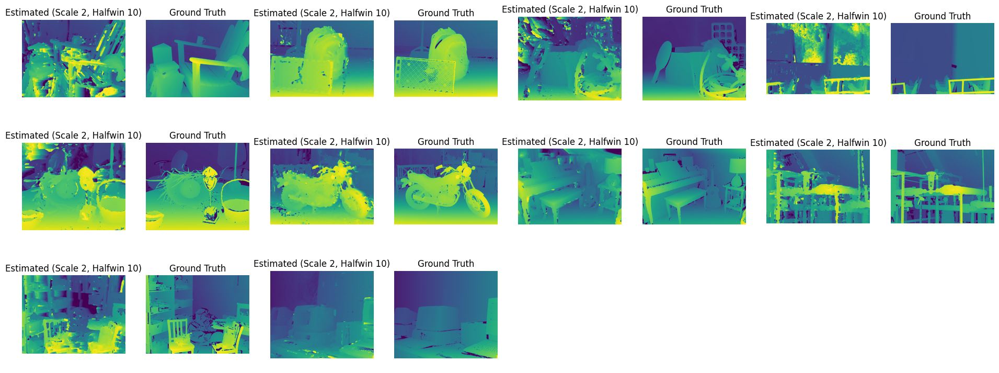

In [89]:
task4one(2,10)